In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
from google.colab import drive
import re
import scipy.ndimage
import math

In [ ]:
#PROBLEM 1

In [ ]:
def apply_low_filter(image, kernel_size):
  blurred_image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
  return blurred_image

def apply_high_filter(image, kernel_size):
  blurred_image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
  laplacian_image = cv2.Laplacian(blurred_image, cv2.CV_64F)
  sharpened_image = np.clip(image - laplacian_image, 0, 255).astype(np.uint8)
  return sharpened_image

def combine_and_show(img1, img2, kernel_size):
  w = min(img1.shape[1], img2.shape[1])
  h = min(img1.shape[0], img2.shape[0])

  fig, axs = plt.subplots(3, 2)

  print('Original Images - First row')
  axs[0, 0].imshow(img1, cmap='gray')
  axs[0, 0].axis('off')
  axs[0, 1].imshow(img2, cmap='gray')
  axs[0, 1].axis('off')

  img1_resize = cv2.resize(img1, (w, h))
  img2_resize = cv2.resize(img2, (w, h))

  filtered_img1 = apply_low_filter(img1_resize, kernel_size[0])
  filtered_img2 = apply_high_filter(img2_resize, kernel_size[1])

  print('Filtered Images - Second row')
  axs[1, 0].imshow(filtered_img1, cmap='gray')
  axs[1, 0].axis('off')
  axs[1, 1].imshow(filtered_img2, cmap='gray')
  axs[1, 1].axis('off')

  combined_image = cv2.addWeighted(filtered_img1, 0.5, filtered_img2, 0.5, 0)

  print('Combined Image - Third row')
  axs[2, 0].imshow(combined_image, cmap='gray')
  axs[2, 0].axis('off')
  axs[2, 1].imshow(combined_image, cmap='gray')
  axs[2, 1].axis('off')

  plt.subplots_adjust(hspace=0.2)
  plt.show()


In [ ]:
drive.mount('content')
image1 = cv2.imread('/content/image1.jpeg', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread('/content/image2.jpeg', cv2.IMREAD_GRAYSCALE)
image3 = cv2.imread('/content/image3.jpeg', cv2.IMREAD_GRAYSCALE)
image4 = cv2.imread('/content/image4.jpeg', cv2.IMREAD_GRAYSCALE)

list_images = [image1, image2, image3, image4]

Mounted at content


Original Images - First row
Filtered Images - Second row
Combined Image - Third row


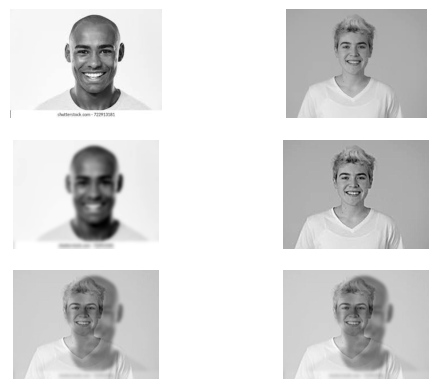

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


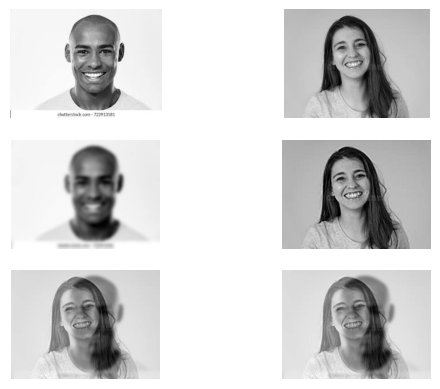

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


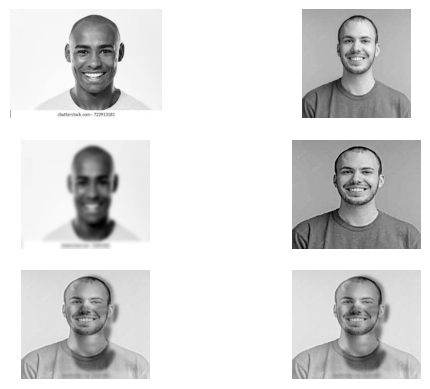

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


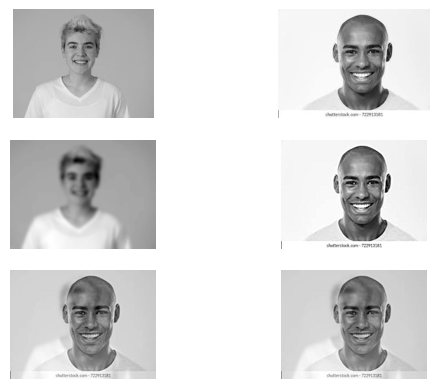

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


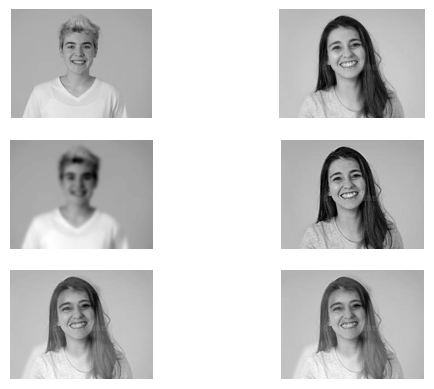

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


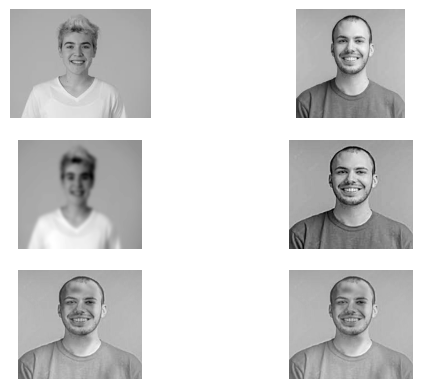

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


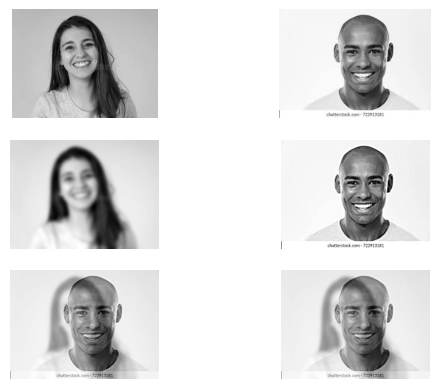

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


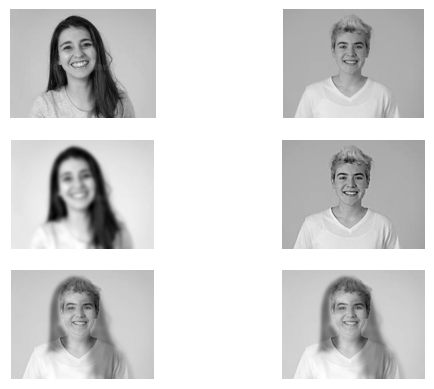

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


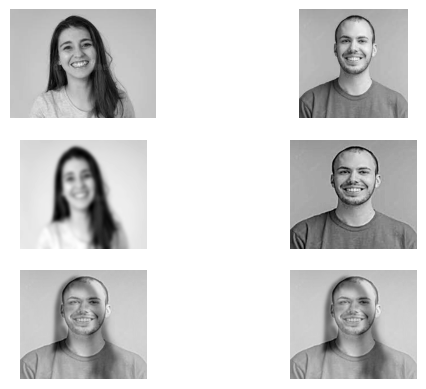

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


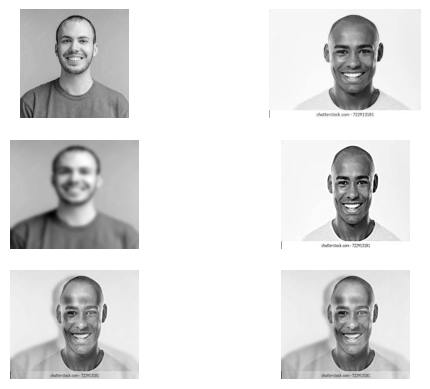

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


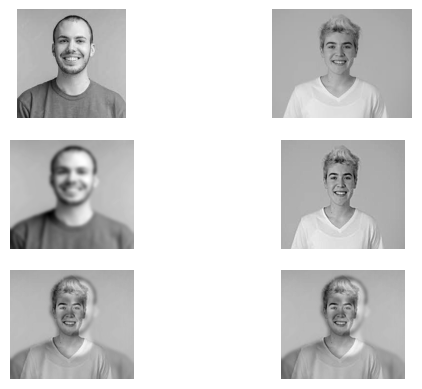

Original Images - First row
Filtered Images - Second row
Combined Image - Third row


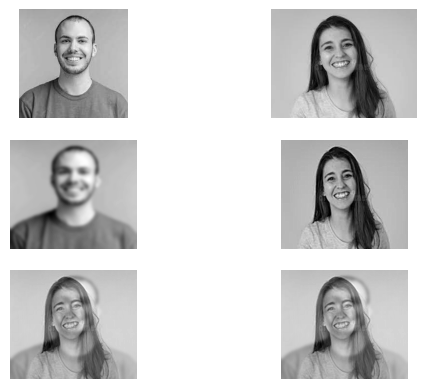

In [ ]:
for img1 in list_images:
  for img2 in list_images:
    if np.array_equal(img1, img2):
      continue
    combine_and_show(img1, img2, [15, 5])

In [ ]:
#PROBLEM 2

In [ ]:
drive.mount('content')
PATH = "/content/content/MyDrive/NISTSpecialDatabase4GrayScaleImagesofFIGS"

imgs = glob.glob(PATH + '/**/*.png', recursive=True)
txts = glob.glob(PATH + '/**/*.txt', recursive=True)

Mounted at content


In [ ]:
def img_to_binary(image, threshold):
  _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)
  return binary_image

def morphology_on_img(binary_image):
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
  eroded_image = cv2.erode(binary_image, kernel, iterations=1)
  dilated_image = cv2.dilate(eroded_image, kernel, iterations=1)
  return dilated_image

def edge_extraction(image):
  edges = cv2.Canny(image, 120, 240)
  return edges

In [ ]:
imgs = imgs[:100]

In [ ]:
binary_img = [img_to_binary(cv2.imread(i, 0), 100) for i in imgs]
morph_img = [morphology_on_img(i) for i in binary_img]
edges_img = [edge_extraction(i) for i in morph_img]

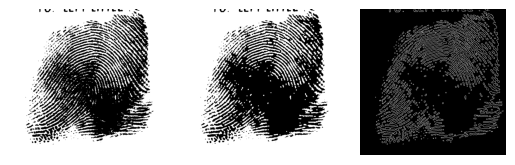

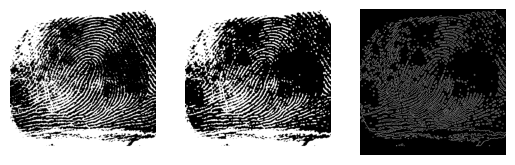

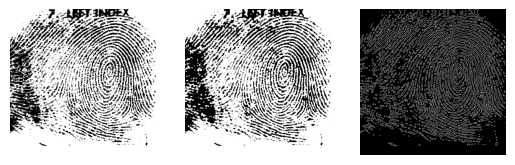

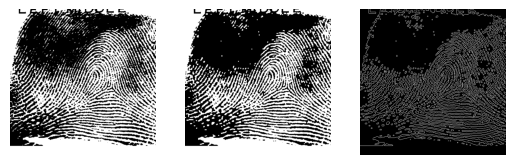

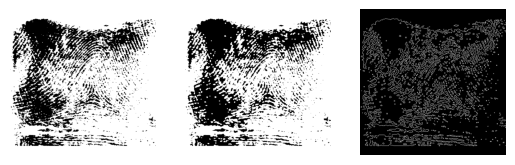

...

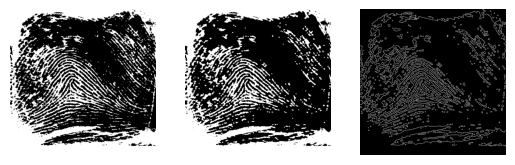

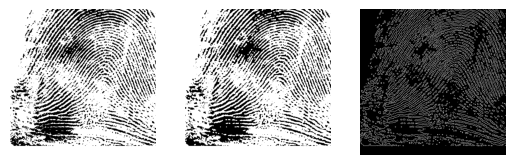

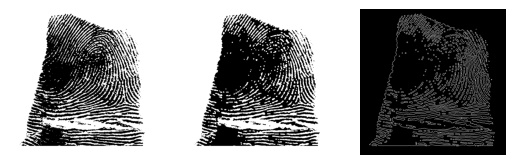

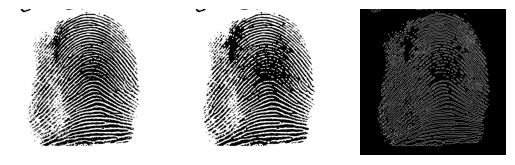

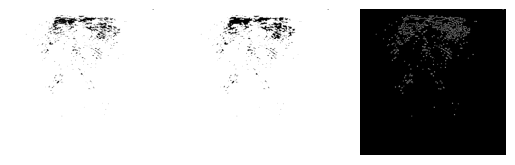

In [ ]:
for b, m, e in zip(binary_img, morph_img, edges_img):
  fig, axs = plt.subplots(1, 3)
  axs[0].imshow(b, cmap='gray')
  axs[0].axis('off')
  axs[1].imshow(m, cmap='gray')
  axs[1].axis('off')
  axs[2].imshow(e, cmap='gray')
  axs[2].axis('off')
  plt.subplots_adjust(hspace=0.2)
  plt.show()

In [ ]:
def matrix_rotate(image):
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(cnt)
    moments = cv2.moments(cnt)
    hu_moments = cv2.HuMoments(moments)
    theta = -np.arctan2(hu_moments[1], hu_moments[0]) * 180 / np.pi
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, int(theta), 1.0)
    return M

def preprocess(kernel, fingerprint):
  _, fingerprint = cv2.threshold(fingerprint, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
  fingerprint = cv2.morphologyEx(fingerprint, cv2.MORPH_OPEN, kernel)
  fingerprint = cv2.morphologyEx(fingerprint, cv2.MORPH_CLOSE, kernel)
  fingerprint = cv2.dilate(fingerprint, kernel, iterations=1)

def train(fingerprints, class_labels_list, train_rotation_matrices, class_labels, kernel):
  for i, fingerprint in enumerate(fingerprints):
    fingerprint = preprocess(kernel, fingerprint)
    rotation_matrix = matrix_rotate(fingerprint)
    train_rotation_matrices.append(rotation_matrix)
    class_labels.append(class_labels_list[i])

    return class_labels, train_rotation_matrices

def classify(new_fingerprints, train_rotation_matrices, class_labels, kernel):
  classifications = []
  for new_fingerprint in new_fingerprints:
    new_fingerprint = preprocess(kernel, new_fingerprint)
    new_rotation_matrix = matrix_rotate(new_fingerprint)
    similarities = []
    for sample_rot in train_rotation_matrices:
        similarity = np.sum(np.abs(sample_rot - new_rotation_matrix))
        similarities.append(similarity)
    classifications.append(class_labels[np.argmin(similarities)])

  return classifications

In [ ]:
images_list_train = []
labels_list_train = []
images_list_test = []
labels_list_test = []

images_list_train = [cv2.imread(img, cv2.IMREAD_GRAYSCALE) for i, img in enumerate(imgs) if i < 80]
labels_list_train = [(txts[i]) for i in range(len(imgs)) if i < 80]
images_list_test = [cv2.imread(img, cv2.IMREAD_GRAYSCALE) for i, img in enumerate(imgs) if 80 <= i < 100]
labels_list_test = [(txts[i]) for i in range(len(imgs)) if 80 <= i < 100]


In [ ]:
train_rotation_matrices = []
class_labels = []
kernel = np.ones((3, 3), np.uint8)

labels, train_rotation_matrices = train(images_list_train, labels_list_train, train_rotation_matrices, class_labels, kernel)

labels_pred = classify(images_list_test, train_rotation_matrices, labels, kernel)

print(*labels_pred)

error: ignored